#  __Using <font color=blue><a href=https://mlbi-lab.net>SCODA</a></font> for Single-cell RNA-seq data analysis and mining__

- This Jupyter notebook provides example code for visualizing and mining the results processed by <a href=https://mlbi-lab.net>__SCODA__</a>, a single-cell RNA-seq data analysis pipeline developed by __MLBI Lab__.
- Data mining is conducted using the __SCODA-viz__ package and includes the following components:

<br>

1. <font color=blue>Review of cell type annotation results</font>
   - Preprocessing for visualization and generation of UMAP coordinates
   - Visualization of celltype marker expression patterns
   - Examination of cell type populations and identification of condition-specific features
2. <font color=blue>Review of CNV and tumor cell identification results</font>
   - Visualization of CNV patterns via heatmap
   - Tumor cell identification confirmed via UMAP projection
3. <font color=blue>Profiling of ligand–receptor interactions between cell types</font>
  - Structure and composition of CCI result data
  - Visualization using dot plots and circle plots
  - Statistical testing of condition-specific interactions and visualization via boxplots
4. <font color=blue>Differential expression analysis and marker/target discovery</font>
  - Structure of DEG result data
  - Inspection of DEG results
  - Marker/target discovery and visualization using dot plots
5. <font color=blue>Gene set analysis (GSA) and interpretation of enrichment results</font>
  - Structure of GSA/GSEA output data
  - Visualization of GSA/GSEA results using barplots
  - Visualization of GSA/GSEA results using dotplots

6. <font color=firebrick>Auxiliary analysis using cancer genomics big data</font> (e.g., METABRIC or TCGA data)
7. <font color=firebrick>Visualization of pathway-level changes using KEGG Pathview</font> (provided in a separate notebook using R)

<br>

__MLBI-lab, July 27, 2025__

contact: mlbi@mlbi-lab.com




## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz==0.4.30b
## This jupyter notebook was tested with the above version of scoda-viz package.

In [ ]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot, add_to_subset_markers
from scodaviz import plot_deg, plot_marker_exp, plot_cnv_hit
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population_per_sample, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations, decompress_tar_gz
from scodaviz import get_amp_regions_for_known_markers, plot_cnv_stat
from scodaviz.misc import show_tree

warnings.filterwarnings('ignore')

https://github.com/combio-dku


## __2A. Download a preprocessed data__

In [ ]:
dataset = 'NSCLC'  ## You can choose one of ['BC', 'NSCLC', 'PDAC', 'CRC', 'Colitis-mm', 'Colitis-hs']
adata_t = load_scoda_processed_sample_data( dataset )
adata_t

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져올 수 있습니다.

In [ ]:
file_h5ad = 'NSCLC_GSE131907_lung_30K_v3_scoda_results.h5ad'

## Or, run
# file_h5ad = decompress_tar_gz('your_tar_gz_file', remove_org = False)

In [ ]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 29398 × 20783
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_mutation', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg'
    var: 'gene_symbol', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca',

## __3. Check your SCODA-processed data__

#### __AnnData Format:__ https://anndata.readthedocs.io/en/stable/
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [ ]:
show_tree(adata_t, max_depth = 3, n_to_show = 3)

AnnData object with n_obs × n_vars = 29398 × 20783
├── X: array (shape=(29398, 20783), dtype=float32)
├── obs: DataFrame (29398, 36), cols=[Barcode, Tumor, Sample, ... ])
├── var: DataFrame (20783, 5), cols=[gene_symbol, variable_genes, chr, ... ])
├── obsm: (AxisArrays)
│    ├── HiCAT_result       : DataFrame (29398, 17), cols=[cell_type_major, cell_type_minor, cell_type_subset, ... ])
│    ├── X_cnv              : array (shape=(29398, 1428), dtype=float64)
│    ├── X_cnv_pca          : array (shape=(29398, 15), dtype=float64)
│    ├── X_pca              : array (shape=(29398, 15), dtype=float64)
│    └── inferploidy_results: DataFrame (29398, 10), cols=[1, 2, 3, ... ])
├── obsp: (PairwiseArrays)
│    ├── cnv_neighbor_graph_connectivity: array (shape=(29398, 29398), dtype=int64)
│    └── cnv_neighbor_graph_distance    : array (shape=(29398, 29398), dtype=float64)
├── varm: (AxisArrays)
│    └── (empty)
├── varp: (PairwiseArrays)
│    └── (empty)
└── uns: (dict)
     ├── CCI           

In [ ]:
adata_t.obs.head()

In [ ]:
## Cell-selection example
b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata = adata_t[b,:]
adata

In [ ]:
adata.obs['sample'].value_counts()

In [ ]:
## Example: writing anndata to a file
adata.write('Epi_only.h5ad')

In [ ]:
## Example: getting cell-by-gene count matrix as a data frame
X_full = adata.to_df()
X_full.head()

In [ ]:
adata_t.obs[['sample', 'condition']].value_counts()

In [ ]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 400), th=30, title_y=0.85 )

In [ ]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=10, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

In [ ]:
adata_t.uns['analysis_parameters']

In [ ]:
adata_t.obsm['HiCAT_result']

## __4. Explore your data__
A. <font color=blue>세포유형 식별결과 확인</font>
   - 시각화를 위한 기본 처리 및 UMAP 좌표 생성
   - 세포유형 마커 발현 패턴 확인
   - 세포유형 population 확인 및 조건특이적 특징 판별

B. <font color=blue>CNV 및 암세포 식별 결과 확인</font>
   - CNV heatmap 확인
   - UMAP을 통한 암세포 식별 결과 확인

C. <font color=blue>세포유형간 ligand-receptor 상호작용 프로파일</font>
   - 결과 데이터의 구성
   - dot plot 및 circle plot을 이용한 확인
   - 조건-특이적 상호작용의 통계적 검정 및 boxplot을 이용한 확인   

D. <font color=blue>DEG 분석 결과 및 마커/표적 탐색</font>
   - DEG 결과 데이터의 구성
   - DEG 결과의 확인
   - 마커/표적 탐색 및 dotplot을 이용한 확인

E. <font color=blue>유전자 집합 분석(Gene Set Analysis) 결과 확인</font>
  - GSA/GSEA 결과 데이터의 구성
  - barplot을 이용한 GSA/GSEA 결과의 확인
  - dotplot을 이용한 GSA/GSEA 결과의 확인

F. <font color=firebrick>암유전체 빅데이터의 보조적 활용</font>

G. <font color=firebrick>KEGG pathview 생성하여 pathway상의 변화 확인</font> (별도의 주피터 노트북 제공)

### __A. Review of cell type annotation results__

- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/
- __HiCAT:__ https://github.com/combio-dku/HiCAT

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

#### __A.1 Basic preprocessing for UMAP projection__
- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:].copy()
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

#### __A.2 An overview of celltype annotation result__
- __HiCAT:__ https://github.com/combio-dku/HiCAT

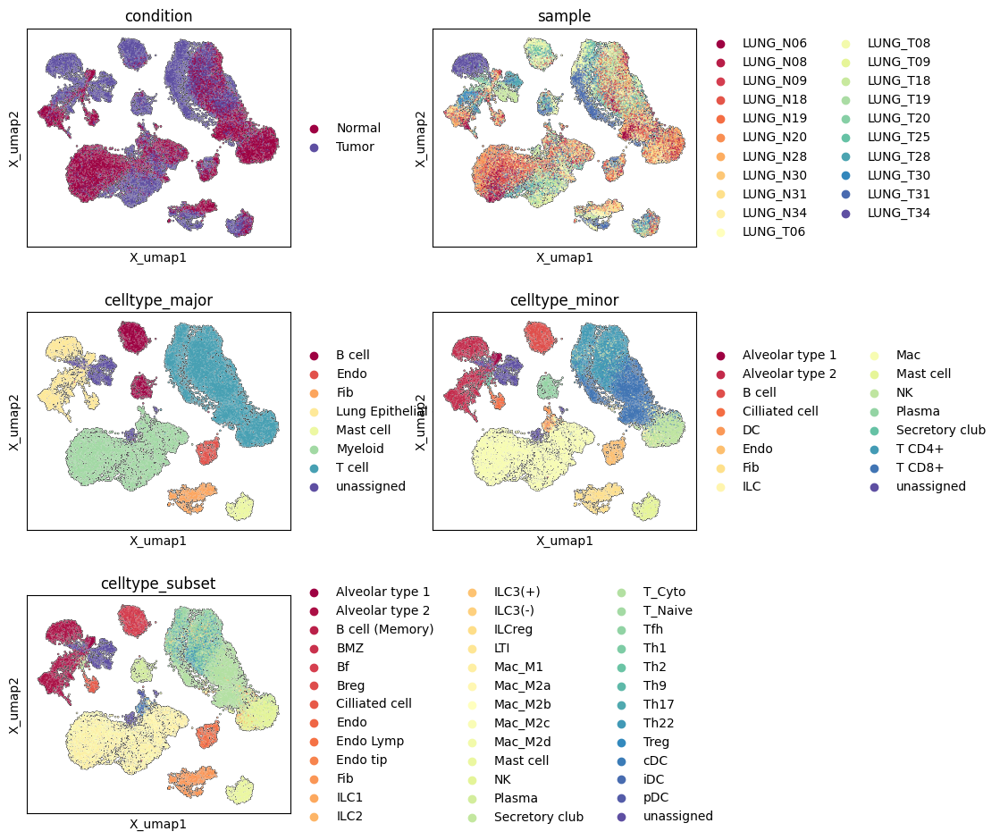

In [ ]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

## Abbreviate cell names
cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

#### __A.3 Inspecting minor-type annotation result__

In [ ]:
adata.obs['celltype_minor'].value_counts()

celltype_minor
Mac                8138
T CD8+             4912
T CD4+             4768
Alveolar type 2    2463
NK                 2075
B cell             1375
Fib                1122
unassigned          997
Mast cell           890
ILC                 742
Endo                618
Plasma              537
Cilliated cell      248
DC                  230
Alveolar type 1     209
Secretory club       74
Name: count, dtype: int64

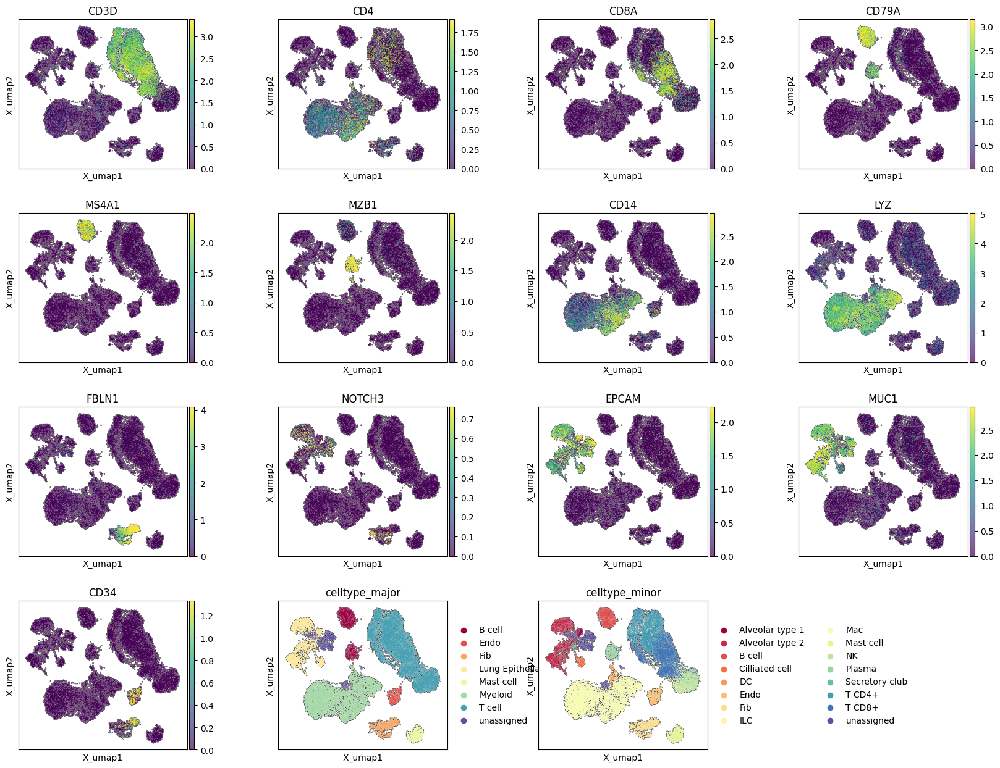

In [ ]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = [g for g in genes if g in genes_all] + items_to_plot

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3,
                 legend_fontsize = 10,ncols = 4, palette = 'Spectral',
                 add_outline = True, vmax = 'p99', vmin = 0)

#### __A.4 Subset marker expression profile__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 174 -> 120


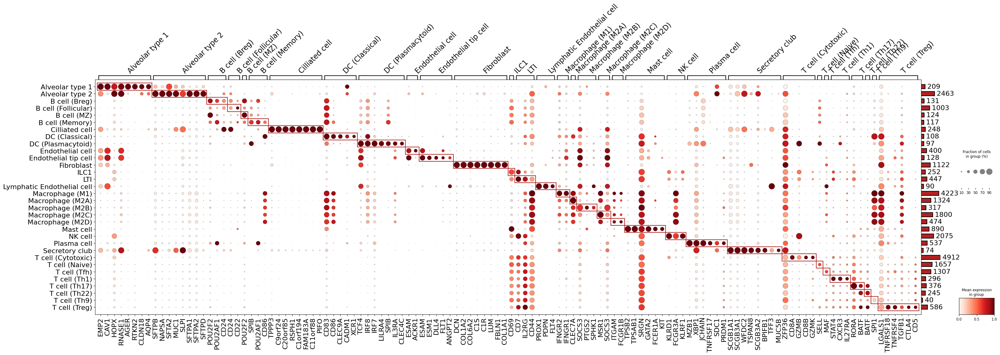

In [ ]:
mkr_dct_selected = plot_marker_exp(  adata_t, markers = None,
                  N_cells_per_group_min = 30, N_markers_per_group_max = 8, N_markers_total = 120,
                  title = None, title_y_pos = 1.1, title_fs = 30,
                  text_fs = 16, standard_scale = 'var',
                  var_group_rotation = 45, var_group_height = 1.2,
                  nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3,
                  figsize = None, swap_ax = False, legend = True,
                  cmap = 'Reds', linewidth = 1.5, linecolor = 'firebrick')

#### __Practice:__ Visualizing T-cell subsets

In [ ]:
b = adata_t.obs['celltype_major'] == 'Myeloid cell'
adata = adata_t[b,:].copy()

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

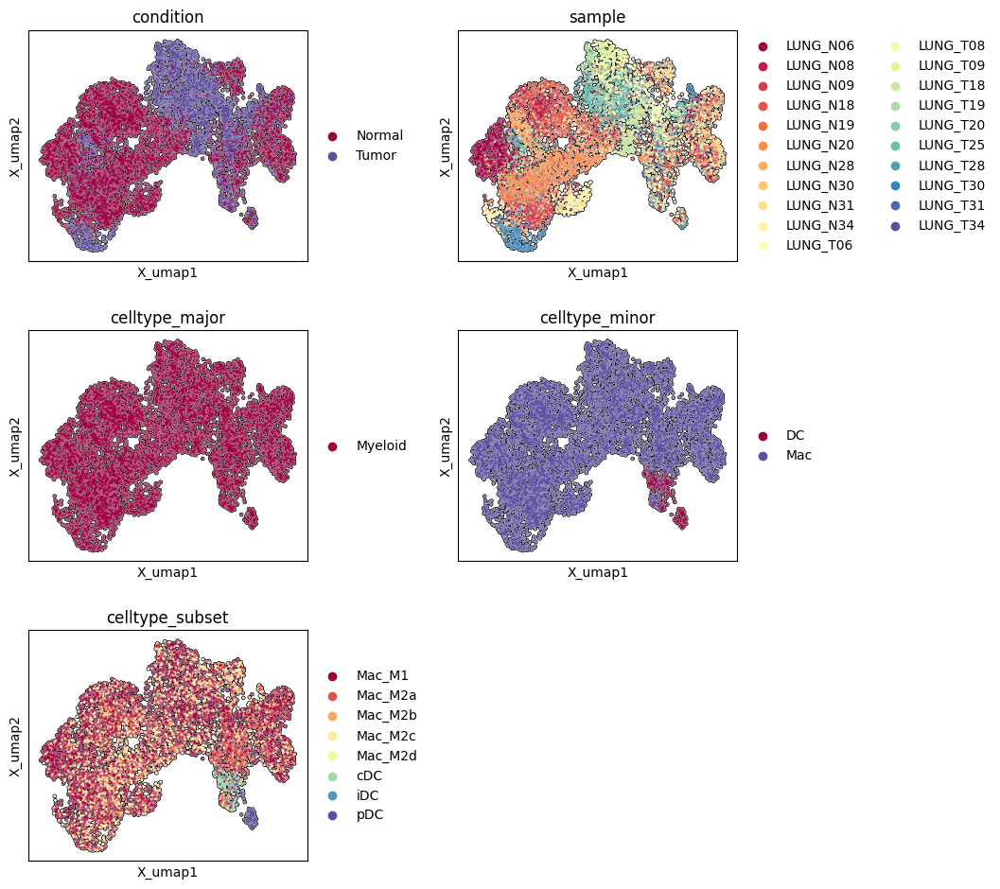

In [ ]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

#### __A.5 Inspecting celltype population__


,Group,Alveolar type 1,Alveolar type 2,B cell,Cilliated cell,Dendritic cell,Endothelial cell,Fibroblast,ILC,Macrophage,Mast cell,NK cell,Plasma cell,Secretory club,T cell CD4+,T cell CD8+,unassigned
LUNG_N06,Normal,0.9,3.9,0.4,1.5,0.4,0.1,0.4,0.9,44.4,1.1,6.0,0.1,0.4,8.6,30.9,0.1
LUNG_N08,Normal,2.0,4.2,1.1,1.6,0.4,3.1,0.7,2.1,41.6,2.3,19.6,0.1,0.5,10.7,9.5,0.4
LUNG_N09,Normal,0.8,13.8,1.8,0.5,0.4,1.5,2.4,1.2,45.6,3.9,6.0,1.4,0.3,9.2,11.1,0.1
LUNG_N18,Normal,1.9,2.2,1.0,2.9,1.9,3.6,3.6,2.6,44.9,1.9,5.1,0.2,0.6,13.3,14.1,0.1
LUNG_N19,Normal,0.3,3.9,0.6,0.2,0.5,10.1,2.6,1.3,30.9,4.8,23.9,0.4,0.2,8.6,11.6,0.1
LUNG_N20,Normal,0.7,3.7,0.4,0.4,0.4,1.1,0.5,1.0,61.8,2.0,12.4,0.1,0.2,5.4,10.1,0.0
LUNG_N28,Normal,0.4,6.3,0.2,0.0,0.5,0.4,0.2,1.4,22.4,1.5,16.6,0.1,0.0,16.4,33.2,0.4
LUNG_N30,Normal,1.6,2.6,0.6,3.3,0.9,4.7,5.6,7.9,22.9,1.2,7.6,0.1,1.6,15.1,24.3,0.1
LUNG_N31,Normal,2.2,5.6,0.1,3.9,1.1,3.8,19.9,1.0,31.0,0.7,14.8,0.2,0.4,5.4,9.5,0.3
LUNG_N34,Normal,2.0,7.5,0.6,1.6,0.4,1.8,2.9,8.2,32.9,1.2,20.1,0.1,0.4,5.0,15.3,0.1


<Figure size 350x350 with 0 Axes>

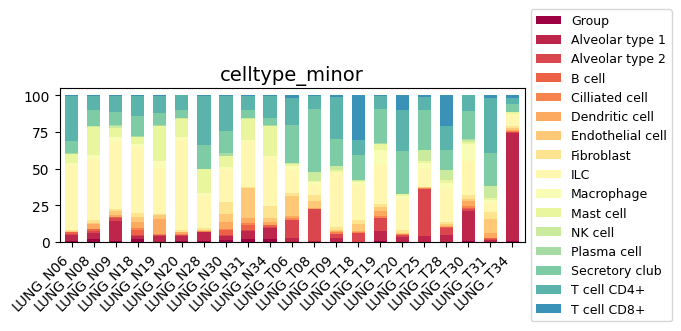

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [] )

## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct, bar_width = 0.6,
                 title = celltype_col, title_fs = 14,
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'center left', bbox_to_anchor = (1,0.5),
                 legend_ncol = 1, cmap = None, figsize=(6, 2), dpi = 100)

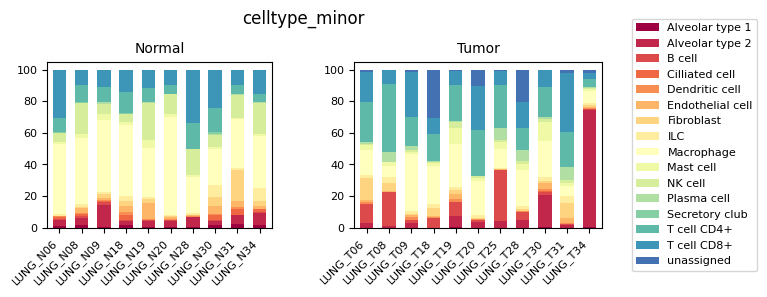

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

plot_population_grouped( df_pct, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'center left', bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1, cmap = None, figsize=(7, 2), dpi = 100,
                         wspace = 0.35, hspace = 0.2 )

#### __A.6 Inspecting condition-specificity in celltype population__

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], df_pct['Group'], ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, stripplot_ms = 5, cmap = 'tab10')

#### __Practice: Inspecting subset population__

In [ ]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct, sort_by = [],
                         title = col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, bar_width = 0.6,
                         tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left',
                         bbox_to_anchor = (1,1), legend_ncol = 1,
                         cmap = None, figsize=(7, 2), wspace = 0.35, dpi = 100)

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], df_pct['Group'], ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, stripplot_ms = 5, cmap = 'tab10')

### __B. CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNV:__ https://github.com/broadinstitute/infercnv
- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__ https://github.com/combio-dku/InferPloidy

#### __B.1 Inspecting CNV estimates using heatmap__
- We first group the cells into appropriate groups
- then compare the CNV patterns of the resulting cell groups using a heatmap.

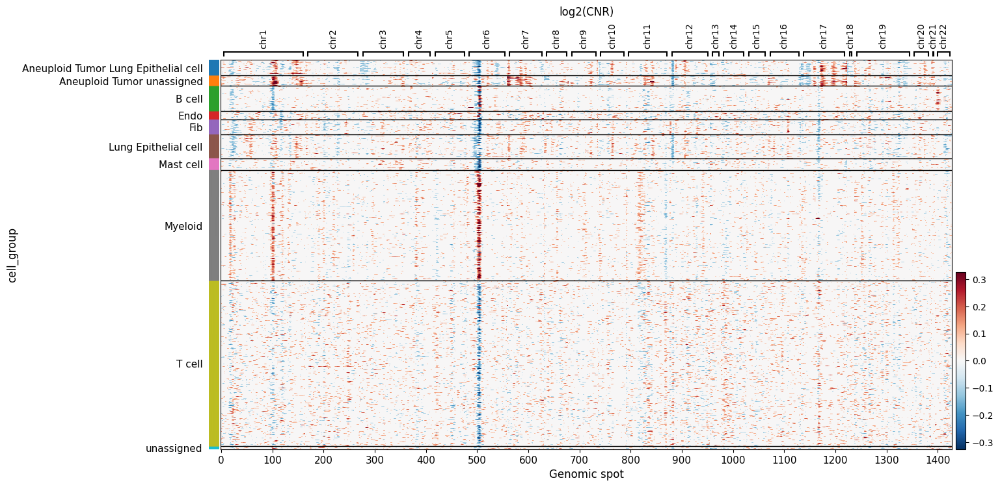

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:].copy()

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].astype(str).copy(deep = True)
adata.obs['cell_group'] = adata.obs['cell_group'].replace(rename_dict['celltype_major'])

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
b = adata.obs['ploidy_dec'] == 'Aneuploid'
adata.obs.loc[b, 'cell_group'] = 'Aneuploid ' + adata.obs.loc[b, 'condition'].astype(str) \
                               + ' ' + adata.obs.loc[b, 'cell_group']

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group', N_cells_min = 200,
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

#### __B.2 Comparison of CNV patterns across samples using only cells identified as tumor cells__

In [ ]:
adata

AnnData object with n_obs × n_vars = 29398 × 20783
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_mutation', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg', 'celltype_subset_rev', 'cell_group'
    var: 'gene_symbol', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_re

INFO: n_samples_min: 4 -> 2 


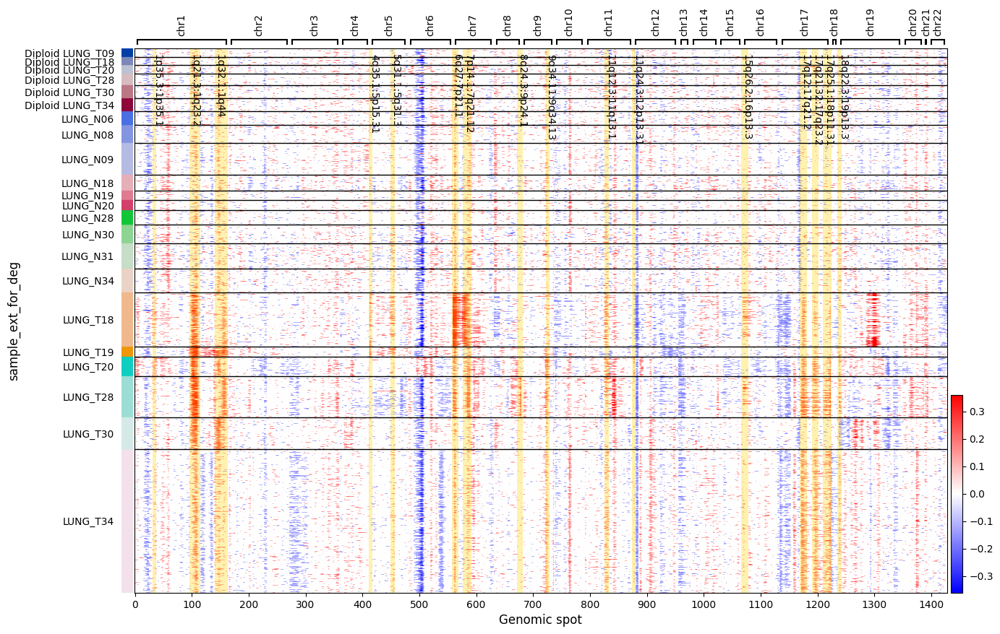

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd, cna_res = plot_cnv( adata_s, groupby = cell_grouping, N_cells_min = 50,
                title = None, title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 10, Ns_min = 4, show_cna_spots = True,
                figsize = (15, 10), swap_axes = False,
                var_group_rotation = 90, cmap='bwr', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

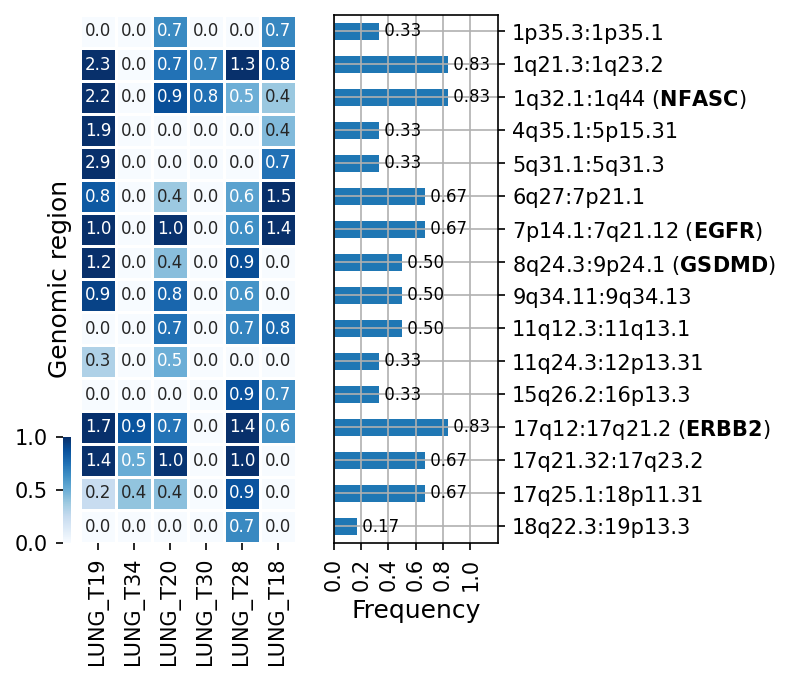

In [ ]:
axes = plot_cnv_hit( cna_res, adata_t, title = None, title_fs = 13,
                     label_fs = 12, tick_fs = 10, wspace = 0.1,
                     dpi = 150, ylabel = 'Genomic region',
                     bin_size = 0.22, cmap = 'Blues')

#### __B.3 Check out genomic spots where CNV has a peak__

In [ ]:
cna_res['spots']

{'1p35.3:1p35.1': array([31, 32, 33, 34, 35, 36]),
 '1q21.3:1q23.2': array([ 96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
        109, 110, 111, 112, 113, 114]),
 '1q32.1:1q44': array([140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152,
        153, 154, 155, 156, 157, 158, 159, 160, 161, 162]),
 '4q35.1:5p15.31': array([411, 412, 413, 414, 415, 416]),
 '5q31.1:5q31.3': array([449, 450, 451, 452, 453, 454, 455, 456]),
 '6q27:7p21.1': array([557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567]),
 '7p14.1:7q21.12': array([577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589,
        590, 591]),
 '8q24.3:9p24.1': array([672, 673, 674, 675, 676, 677, 678, 679, 680, 681]),
 '9q34.11:9q34.13': array([722, 723, 724, 725, 726, 727, 728]),
 '11q12.3:11q13.1': array([826, 827, 828, 829, 830, 831, 832]),
 '11q24.3:12p13.31': array([874, 875, 876, 877, 878, 879]),
 '15q26.2:16p13.3': array([1066, 1067, 1068, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 107

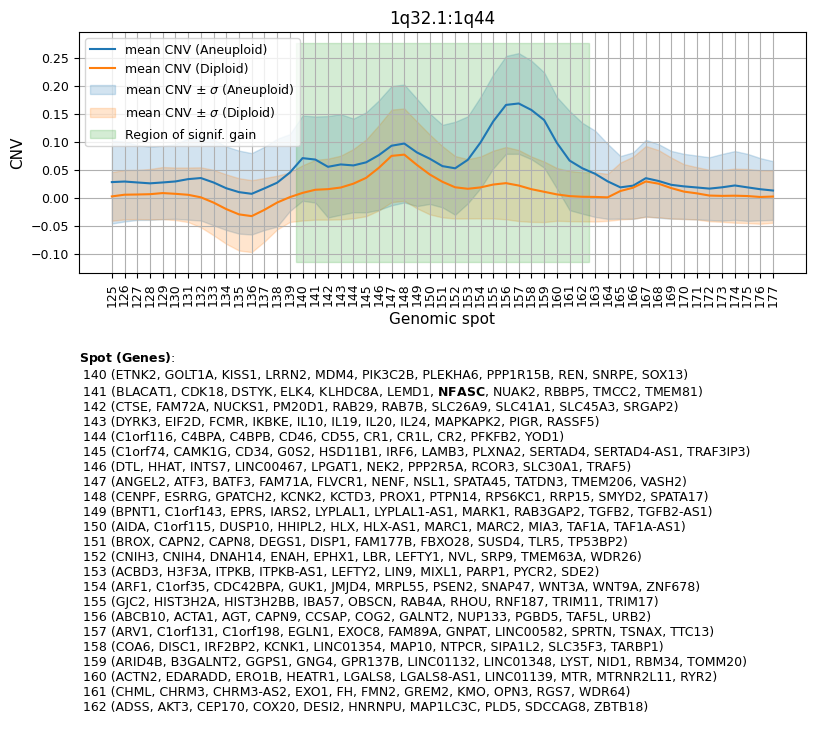

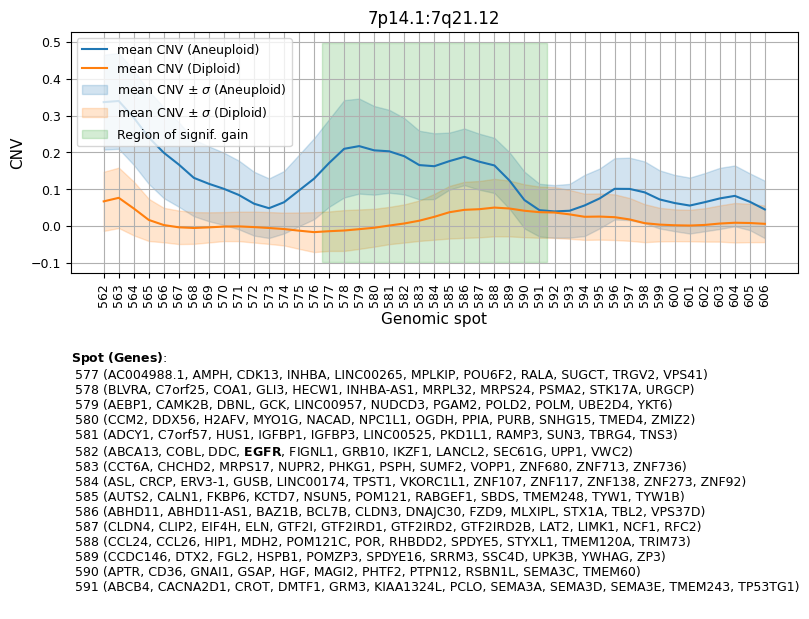

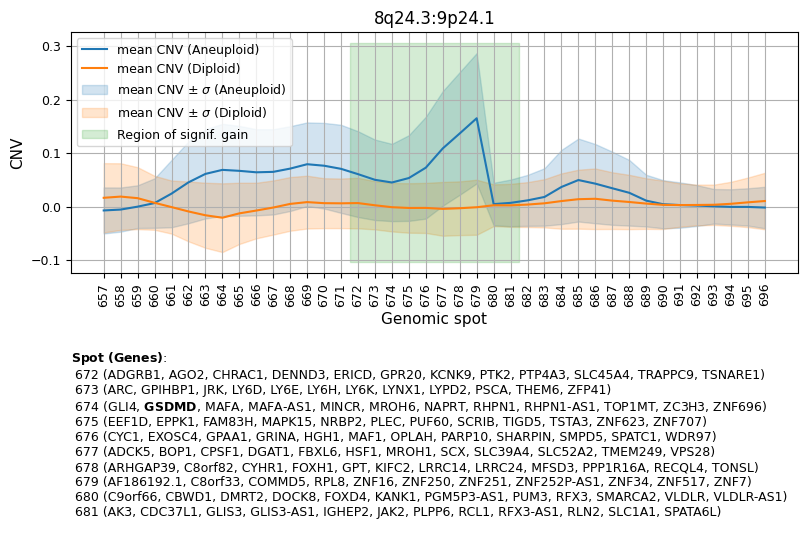

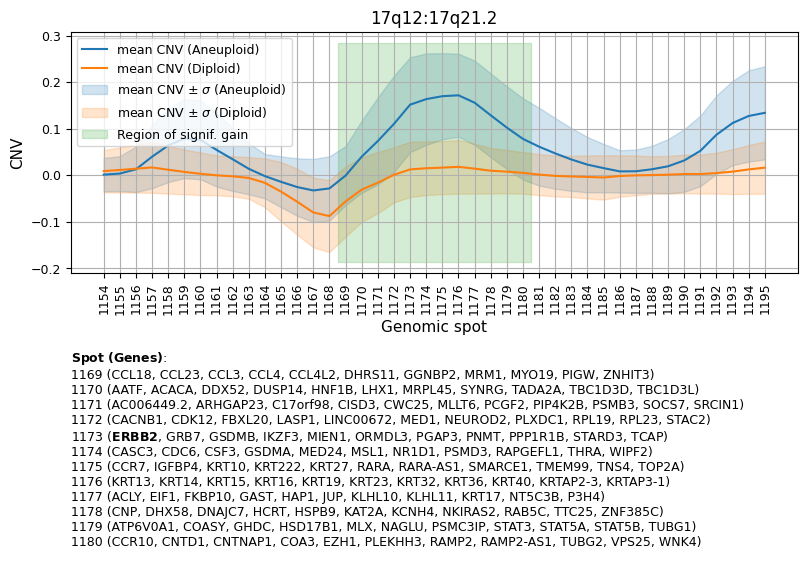

In [ ]:
rngs_dct = get_amp_regions_for_known_markers(adata_s, cna_res['spots'] )

for k in rngs_dct.keys():
    plot_cnv_stat( adata_s, cna_res, k, title = k,
                   # title_fs = 14, label_fs = 12, legend_fs = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   std_scale = 1, figsize = (8,3), ax = None, # cmap_name = 'tab10',
                   grid = True, text_pos_adj = 0.4, rng_ext = 15 )

#### __B.4 Visualizing CNV patterns using UMAP projection__

In [ ]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

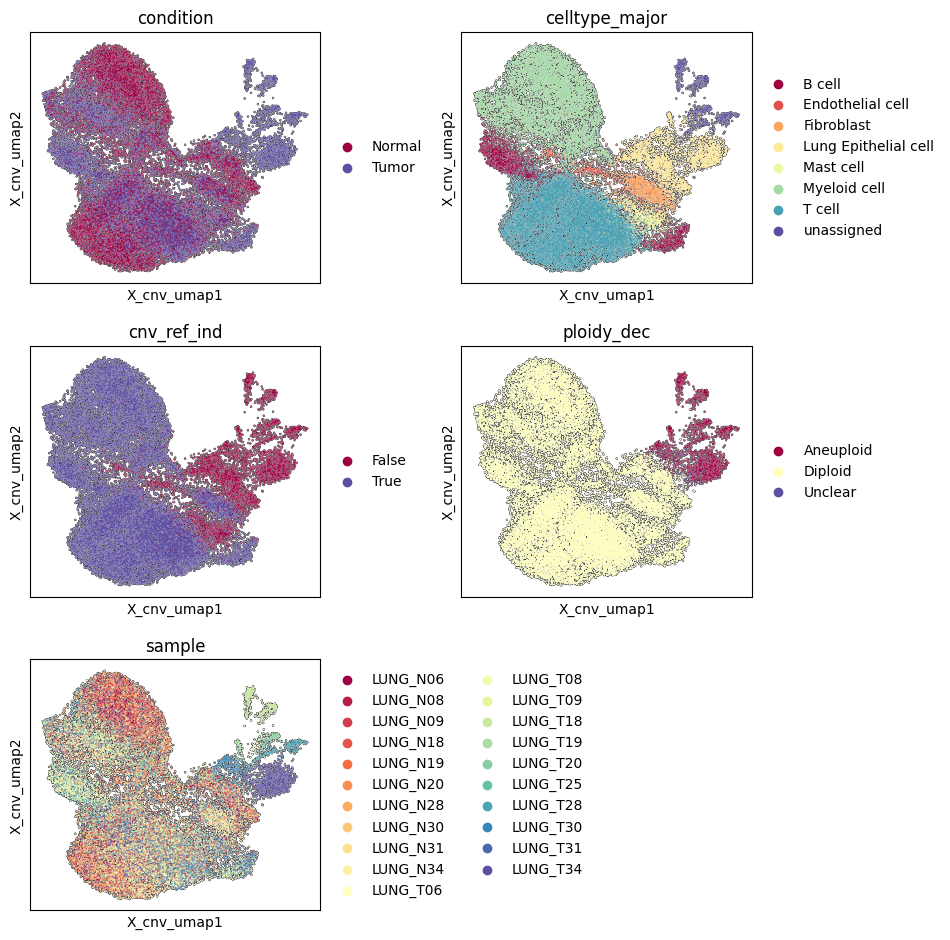

In [ ]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)

#### __B.5  Inspecting aneuploid/diploid cell population__

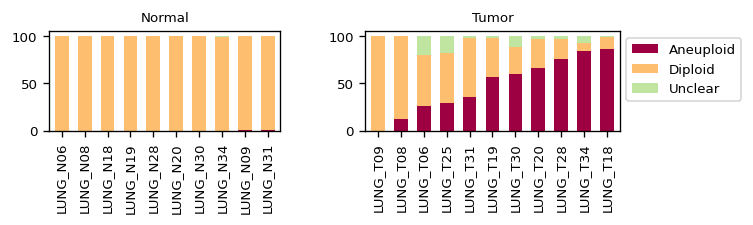

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

col = 'ploidy_dec'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )

plot_population_grouped( df_pct, sort_by = ['Aneuploid'], bar_width = 0.6,
                 title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
                 label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
                 legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap = None, figsize=(6, 1), wspace = 0.35)

### __C. Cell-cell interaction analysis results__
- __CellPhoneDB:__ https://www.cellphonedb.org/

#### __C.1 Structure and format of the cell–cell interaction results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

- The CCI results are stored separately for each sample and each condition.
- The data format is consistent between the two result types.
- For condition-level CCI, only interactions that are commonly observed in a certain percentage of samples within the condition are retained.

In [ ]:
## 샘플 별 CCI 결과
cci_df_dct = adata_t.uns['CCI_sample']
sample_lst = list(cci_df_dct.keys())
sample_lst

['LUNG_N06',
 'LUNG_N08',
 'LUNG_N09',
 'LUNG_N18',
 'LUNG_N19',
 'LUNG_N20',
 'LUNG_N28',
 'LUNG_N30',
 'LUNG_N31',
 'LUNG_N34',
 'LUNG_T06',
 'LUNG_T08',
 'LUNG_T09',
 'LUNG_T18',
 'LUNG_T19',
 'LUNG_T20',
 'LUNG_T25',
 'LUNG_T28',
 'LUNG_T30',
 'LUNG_T31',
 'LUNG_T34']

In [ ]:
## CCI results in a data frame
cci_df_dct[sample_lst[-1]]

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
12oxoLeukotrieneB4_byPTGR1_LTB4R--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,12oxoLeukotrieneB4_byPTGR1_LTB4R,Aneuploid Lung Epithelial cell|Aneuploid Lung ...,12oxoLeukotrieneB4,byPTGR1_LTB4R,Aneuploid Lung Epithelial cell,Aneuploid Lung Epithelial cell,0.000,0.204
LeukotrieneB4_byLTA4H_LTB4R--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,LeukotrieneB4_byLTA4H_LTB4R,Aneuploid Lung Epithelial cell|Aneuploid Lung ...,LeukotrieneB4,byLTA4H_LTB4R,Aneuploid Lung Epithelial cell,Aneuploid Lung Epithelial cell,0.000,1.125
APP_SORL1--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,APP_SORL1,Aneuploid Lung Epithelial cell|Aneuploid Lung ...,APP,SORL1,Aneuploid Lung Epithelial cell,Aneuploid Lung Epithelial cell,0.000,0.931
APP_TNFRSF21--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,APP_TNFRSF21,Aneuploid Lung Epithelial cell|Aneuploid Lung ...,APP,TNFRSF21,Aneuploid Lung Epithelial cell,Aneuploid Lung Epithelial cell,0.000,0.882
AGRN_PTPRS--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,AGRN_PTPRS,Aneuploid Lung Epithelial cell|Aneuploid Lung ...,AGRN,PTPRS,Aneuploid Lung Epithelial cell,Aneuploid Lung Epithelial cell,0.000,0.524
...,...,...,...,...,...,...,...,...
PTPRC_MRC1--T cell CD8+|Macrophage,PTPRC_MRC1,T cell CD8+|Macrophage,PTPRC,MRC1,T cell CD8+,Macrophage,0.000,1.257
SELPLG_SELL--T cell CD8+|T cell CD4+,SELPLG_SELL,T cell CD8+|T cell CD4+,SELPLG,SELL,T cell CD8+,T cell CD4+,0.006,0.117
KLRB1_CLEC2D--T cell CD8+|T cell CD4+,KLRB1_CLEC2D,T cell CD8+|T cell CD4+,KLRB1,CLEC2D,T cell CD8+,T cell CD4+,0.000,1.230
KLRB1_CLEC2D--T cell CD8+|T cell CD8+,KLRB1_CLEC2D,T cell CD8+|T cell CD8+,KLRB1,CLEC2D,T cell CD8+,T cell CD8+,0.000,1.202


In [ ]:
## Condition 별 CCI 결과
cci_df_dct_per_cond = adata_t.uns['CCI']
cond_lst = list(cci_df_dct_per_cond.keys())
cond_lst

['Normal', 'Tumor']

#### __C.2 Inspecting condition-specific CCIs__

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

In [ ]:
cci_df_dct_per_cond = adata_t.uns['CCI']

In [ ]:
adata_t.obs['celltype_for_cci'].value_counts()

celltype_for_cci
Macrophage                        8138
T cell CD8+                       4912
T cell CD4+                       4768
NK cell                           2075
Diploid Lung Epithelial cell      2006
Aneuploid Lung Epithelial cell    1985
B cell                            1375
Fibroblast                        1122
Mast cell                          890
ILC                                742
Endothelial cell                   618
Plasma cell                        537
Dendritic cell                     230
Name: count, dtype: int64

4 cell_pairs, 101 gene_pairs found


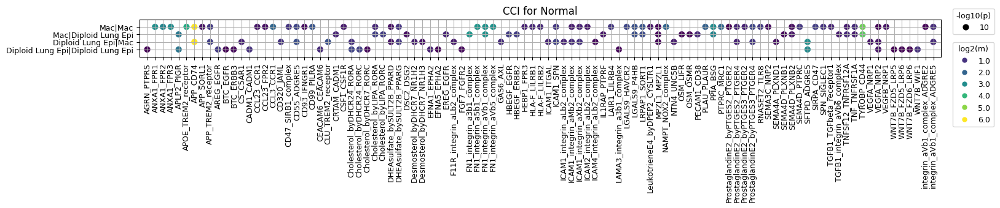

8 cell_pairs, 92 gene_pairs found


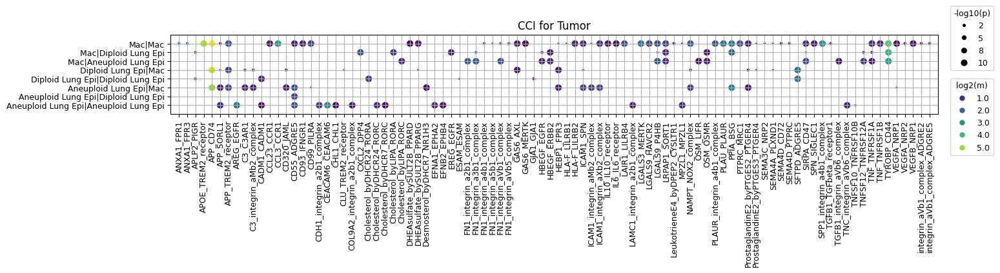

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Lung Epithelial cell',
                'Diploid Lung Epithelial cell',
                'Lung Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 100,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

#### __C.3 Exploring CCis associated with a specific gene set__  

In [ ]:
b1 = adata_t.var_names.str.startswith('CCL')
b2 = adata_t.var_names.str.startswith('CXCL')
b3 = adata_t.var_names.str.startswith('IL')

genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['CCL1', 'CCL11', 'CCL13', 'CCL14', 'CCL15', 'CCL17', 'CCL18',
       'CCL19', 'CCL2', 'CCL20', 'CCL21', 'CCL22', 'CCL23', 'CCL24',
       'CCL26', 'CCL27', 'CCL28', 'CCL3', 'CCL3L3', 'CCL4', 'CCL4L2',
       'CCL5', 'CCL7', 'CCL8', 'CXCL1', 'CXCL10', 'CXCL11', 'CXCL12',
       'CXCL13', 'CXCL14', 'CXCL16', 'CXCL17', 'CXCL2', 'CXCL3', 'CXCL5',
       'CXCL6', 'CXCL8', 'CXCL9', 'IL10', 'IL10RA', 'IL10RB',
       'IL10RB-AS1', 'IL11', 'IL11RA', 'IL12A', 'IL12A-AS1', 'IL12RB1',
       'IL12RB2', 'IL13', 'IL13RA1', 'IL13RA2', 'IL15', 'IL15RA', 'IL16',
       'IL17A', 'IL17B', 'IL17C', 'IL17D', 'IL17F', 'IL17RA', 'IL17RB',
       'IL17RC', 'IL17RD', 'IL17RE', 'IL18', 'IL18BP', 'IL18R1',
       'IL18RAP', 'IL19', 'IL1A', 'IL1B', 'IL1R1', 'IL1R2', 'IL1RAP',
       'IL1RAPL1', 'IL1RL1', 'IL1RL2', 'IL1RN', 'IL2', 'IL20', 'IL20RA',
       'IL20RB', 'IL21', 'IL21-AS1', 'IL21R', 'IL21R-AS1', 'IL22',
       'IL22RA1', 'IL22RA2', 'IL23A', 'IL23R', 'IL24', 'IL26', 'IL27',
       'IL27RA', 'IL2R

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Lung Epithelial cell',
                'Diploid Lung Epithelial cell',
                'Lung Epithelial cell', 'Macrophage', 'Fibroblast']

## CellPhoneDB는 인간 유전자 이름만 사용하므로 마우스의 경우 유전자 이름을 대문자로 변경 필요.
target_genes = [g.upper() for g in genes_sel] + ['NAMPT']

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = 'Reds')

#### __C.4 Inspecting per-sample CCIs__

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Lung Epithelial cell',
                'Diploid Lung Epithelial cell',
                'Lung Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct, n_gene_pairs = 100,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

#### __C.5 Statistical test for condition-specific differences in CCI strength__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

In [ ]:
target_cells = ['Aneuploid Lung Epithelial cell',
                # 'Diploid Lung Epithelial cell',
                'Lung Epithelial cell',
                'Fibroblast', 'Macrophage']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.1 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, ref_group = None, pval_cutoff = 0.05 )
df_res

,Tumor_vs_Normal
SDC1_ADGRA2--Aneuploid Lung Epithelial cell|Fibroblast,0.000118
ICAM2_integrin_aLb2_complex--Macrophage|T cell CD8+,0.000437
CD99_PILRA--T cell CD4+|Macrophage,0.000837
COL4A2_integrin_a1b1_complex--Fibroblast|Fibroblast,0.000985
TYROBP_CD44--Macrophage|Mast cell,0.001733
...,...
LGALS9_P4HB--Macrophage|Aneuploid Lung Epithelial cell,0.047660
F10_integrin_aMb2_complex--Fibroblast|Macrophage,0.048024
GAS6_AXL--Aneuploid Lung Epithelial cell|Macrophage,0.048226
TNFSF12_TNFRSF25--Fibroblast|T cell CD4+,0.048792


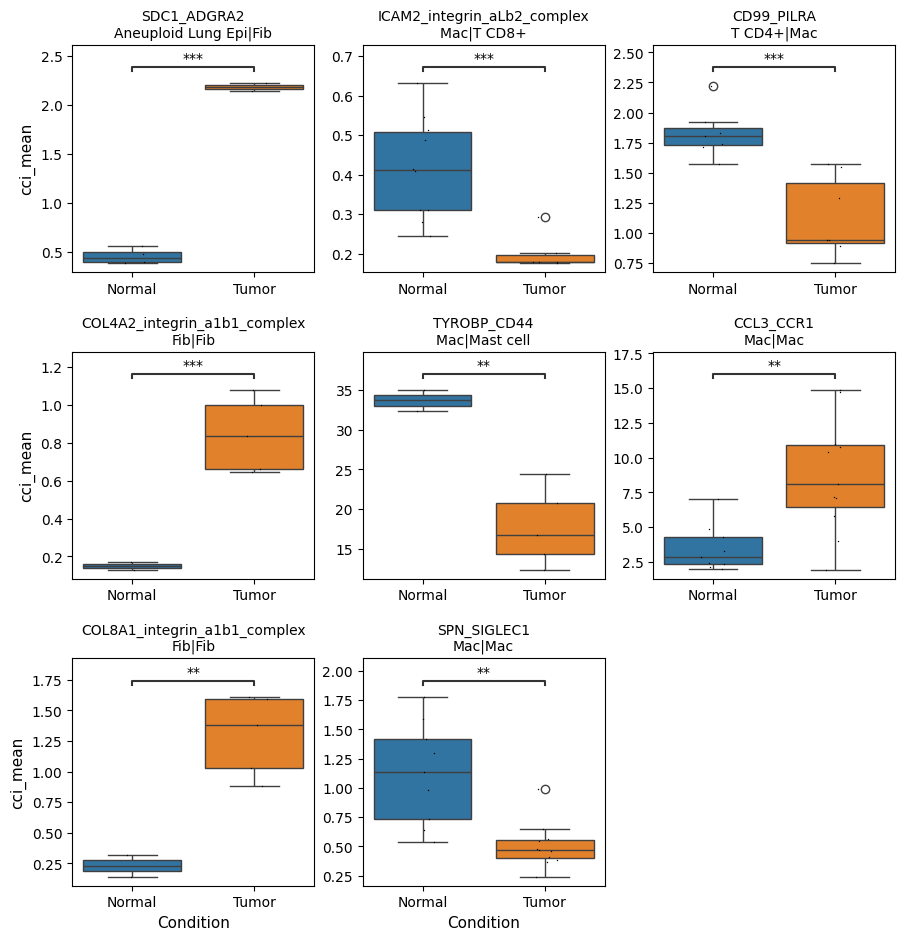

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    plot_pct_box(df[idx_sel], df['Group'], ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'star', annot_fs = 10,
              ws_hs = (0.2, 0.35), stripplot = True, stripplot_ms = 5)

#### __C.6 Statistical test for condition-specific differences in CCI strength (specifying genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
target_cells = ['Aneuploid Lung Epithelial cell',
                'Diploid Lung Epithelial cell',
                'Lung Epithelial cell',
                'Fibroblast', 'Macrophage']
target_genes = ['EGFR', 'ERBB2', 'MET']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.1 )

## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, ref_group = None, pval_cutoff = 0.1, equal_var = True )
df_res

,Tumor_vs_Normal
EREG_EGFR--Macrophage|Aneuploid Lung Epithelial cell,0.017233
AREG_EGFR--Aneuploid Lung Epithelial cell|Diploid Lung Epithelial cell,0.056277
BTC_EGFR--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,0.069810
EREG_EGFR--Macrophage|Diploid Lung Epithelial cell,0.073522
AREG_EGFR--Aneuploid Lung Epithelial cell|Aneuploid Lung Epithelial cell,0.074743
HBEGF_EGFR--Macrophage|Diploid Lung Epithelial cell,0.083247
HGF_MET--Fibroblast|Aneuploid Lung Epithelial cell,0.094338


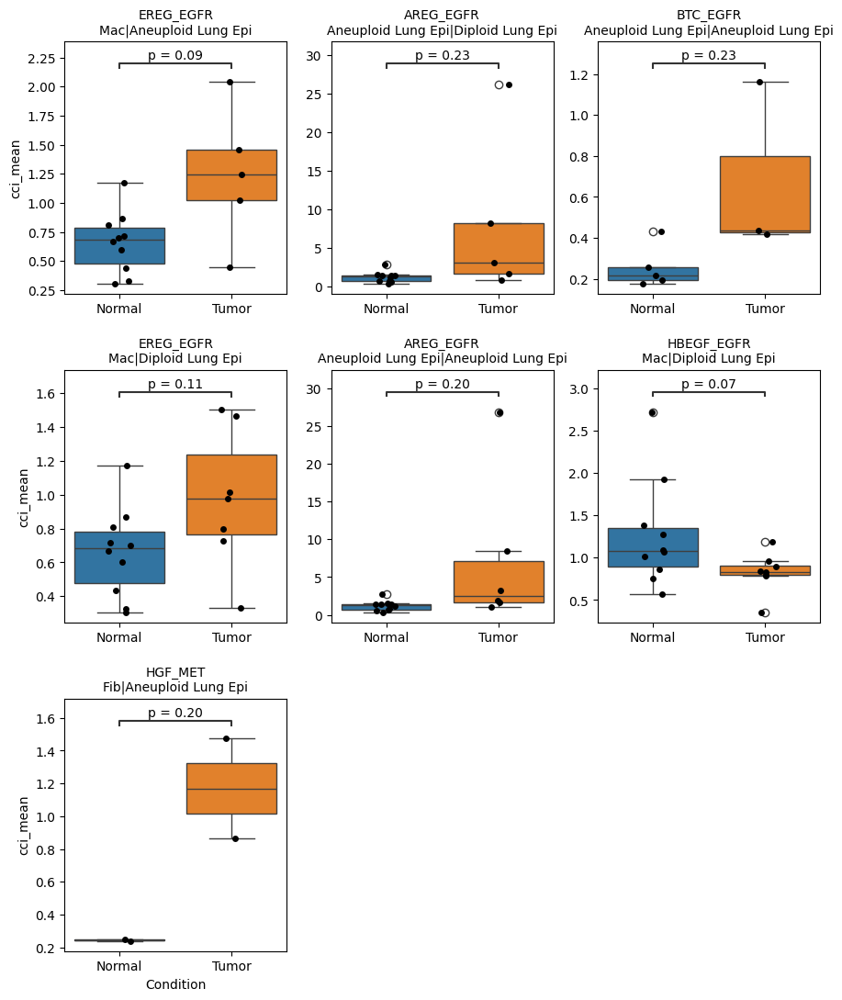

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the selected CCIs
    plot_pct_box(df[idx_sel], df['Group'], ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3.5), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 10, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.3), stripplot = True, stripplot_ms = 5)

#### __C.7 Circle plots for an overview of cell-cell interactions__

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI_sample'], target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

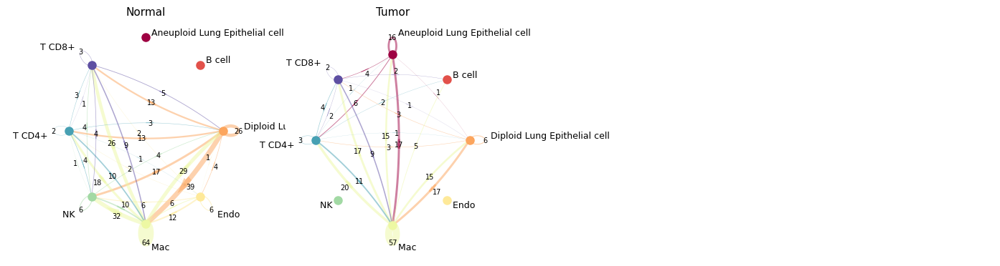

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI'], target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

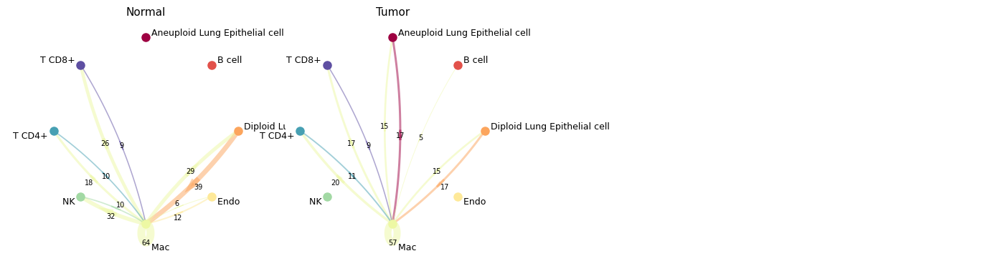

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Mac']

plot_cci_circ_group( adata_t.uns['CCI'], target = target,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

### __D. DEG analysis results and marker/target discovery__

In [ ]:
adata_t

AnnData object with n_obs × n_vars = 29398 × 20783
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_mutation', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg', 'celltype_subset_rev'
    var: 'gene_symbol', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv'

In [ ]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct_of_dct = adata_t.uns['DEG'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct_of_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['Diploid Lung Epithelial cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Lung Epithelial cell',
 'Macrophage',
 'Mast cell',
 'NK cell',
 'T cell CD4+',
 'T cell CD8+']

#### __D.1 Structure and format of the DEG results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

- The DEG results are processed and stored separately for each cell type.
- The cell type level to be used—major, minor, or subset—can be specified in the analysis_parameters when running SCODA.
- The current results are based on the celltype_minor level and reflect condition-specific DEGs identified for each cell type.

In [ ]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Lung Epithelial cell'

df_deg_dct = df_deg_dct_of_dct[target_cell]
nc_deg_dct = nc_deg_dct_of_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg_dct

{'Diploid_vs_others': {'Diploid': 603, 'others': 2263},
 'Normal_vs_others': {'Normal': 1222, 'others': 1644},
 'Tumor_vs_others': {'Tumor': 1041, 'others': 1825}}

In [ ]:
df_deg_dct['Tumor_vs_others'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,nz_pct_pval,gene,Rp
MARCKSL1,3.253,1.031877e-99,1.146209e-95,1.503704,0.312620,0.720461,0.165837,0.501316,2.680363e-104,MARCKSL1,1.0
CDKN2A,3.457,1.336609e-76,1.484705e-72,1.246955,0.203659,0.576369,0.102819,0.463939,2.108171e-79,CDKN2A,1.0
CRABP2,2.949,3.222292e-58,3.579322e-54,1.023720,0.207759,0.545629,0.102819,0.439195,7.367558e-71,CRABP2,0.9
ABCC3,2.063,1.989906e-48,2.210387e-44,1.065239,0.374954,0.686840,0.208955,0.429791,7.057734e-78,ABCC3,1.0
TNFRSF21,3.661,8.074693e-78,8.969369e-74,0.764431,0.086834,0.501441,0.085106,0.419721,1.148644e-70,TNFRSF21,1.0


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

#### __D.2 Gene ranking per celltype__

Lung Epithelial cell


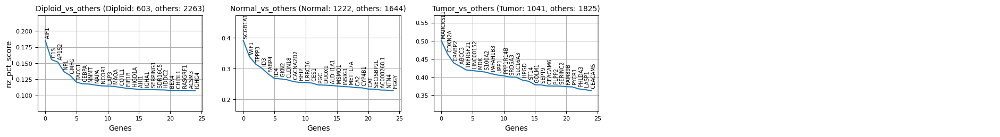

In [ ]:
key = 'Lung Epithelial cell'
df_deg_dct = df_deg_dct_of_dct[key]
nc_deg_dct = nc_deg_dct_of_dct[key]

n_genes_to_show = 25

print(key)
plot_deg( df_deg_dct, reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
          figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
          tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
          deg_stat_dct = nc_deg_dct, show_log_pv = False )


Diploid Lung Epithelial cell


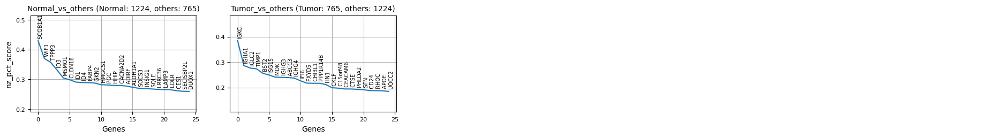

Endothelial cell


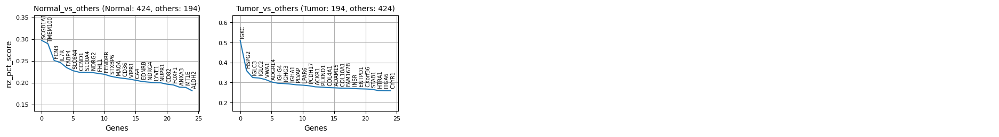

Fibroblast


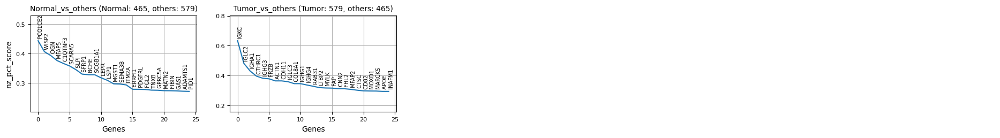

ILC


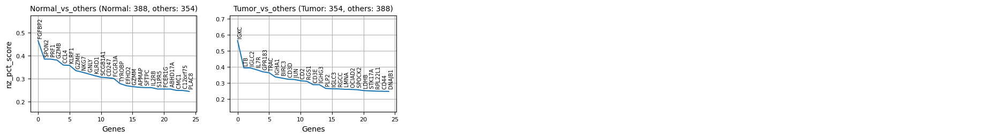

Lung Epithelial cell


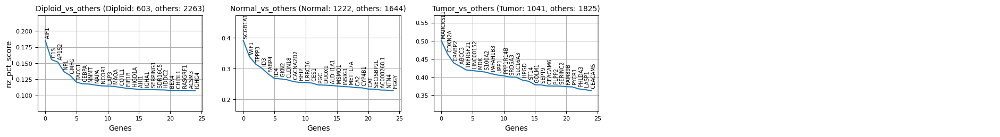

Macrophage


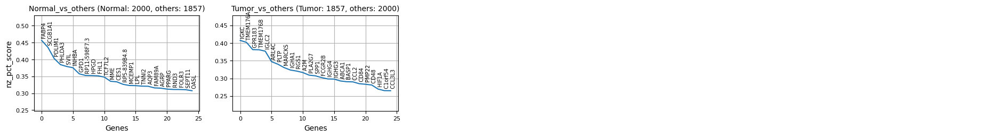

Mast cell


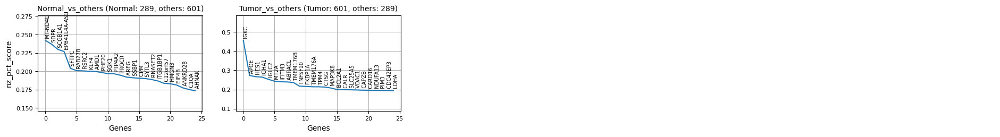

NK cell


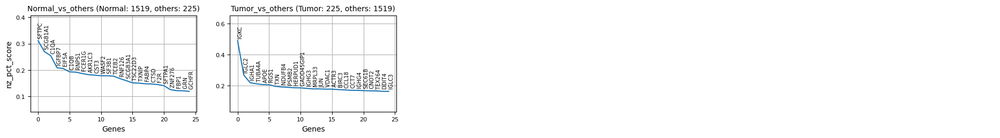

T cell CD4+


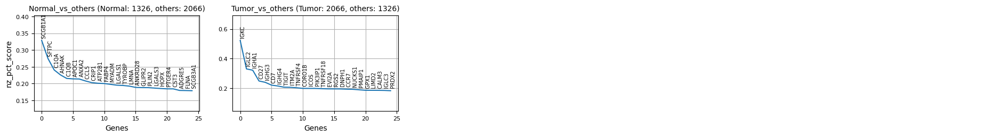

T cell CD8+


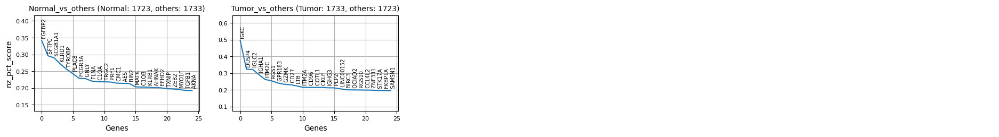

In [ ]:
n_genes_to_show = 25

for key in df_deg_dct_of_dct.keys():
    df_deg_dct = df_deg_dct_of_dct[key]
    nc_deg_dct = nc_deg_dct_of_dct[key]

    print(key)
    plot_deg( df_deg_dct, reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
              figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
              tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
              deg_stat_dct = nc_deg_dct, show_log_pv = False )


#### __D.3 Discovery of condition-specific markers (per-celltype)__

In [ ]:
adata_t

AnnData object with n_obs × n_vars = 29398 × 20783
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_mutation', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg', 'celltype_subset_rev'
    var: 'gene_symbol', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv'

In [ ]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat']
df_deg_dct_of_dct = adata_t.uns['DEG']
df_deg_dct_of_dct.keys()

dict_keys(['Diploid Lung Epithelial cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Lung Epithelial cell', 'Macrophage', 'Mast cell', 'NK cell', 'T cell CD4+', 'T cell CD8+'])

In [ ]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
# target_cell = 'Ductal cell'
target_cell = 'Lung Epithelial cell'

df_deg_lst = df_deg_dct_of_dct[target_cell]

mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 70,
                                            score_cutoff = 0.15,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.25,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])


N_markers: 
   Diploid_vs_others (9117 -> 0) 
   Normal_vs_others (9482 -> 30) 
   Tumor_vs_others (11077 -> 301)
N_markers_selected: Diploid (0), Normal (30), Tumor (70)
Diploid (0):  []
Normal (30):  ['ABCA3', 'ABCA5', 'ADRB2', 'AGER', 'ALPL', 'AQP1', 'AQP4', 'CADM1', 'CD302', 'CD36', 'CD52', 'CLDN18', 'CPM', 'DUOX1', 'DUOXA1', 'EDNRB', 'ESAM', 'FGFR2', 'IL20RA', 'LAMP3', 'LPL', 'MFSD2A', 'MUC15', 'PCDH9', 'PLXNA2', 'SDC2', 'SLC39A8', 'SLC46A2', 'SUSD2', 'VSIG2']
Tumor (70):  ['ABCA7', 'ABCC3', 'ADAM15', 'ADGRF1', 'AMIGO2', 'AQP5', 'BST2', 'CD24', 'CD82', 'CEACAM5', 'CEACAM6', 'CLDN10', 'CLDN3', 'CPD', 'CX3CL1', 'DDR1', 'DSG2', 'ECE1', 'EFNA4', 'EGFR', 'EMB', 'EMP1', 'EPHA2', 'EPHB4', 'ERBB2', 'EREG', 'GPR160', 'GPRC5C', 'HM13', 'IFNAR1', 'IFNAR2', 'IFNGR2', 'IL10RB', 'IL13RA1', 'ITGA2', 'ITGA3', 'ITGAV', 'ITGB4', 'LTBR', 'MET', 'MPZL1', 'MUC4', 'MYOF', 'NRP1', 'NT5E', 'OSMR', 'PAM', 'PDLIM5', 'PLAUR', 'PLPP2', 'PMEPA1', 'PRSS8', 'RNF130', 'SERINC2', 'SEZ6L2', 'SLC12A2', 'SLC12A7', '

Num markers selected: 49 -> 49


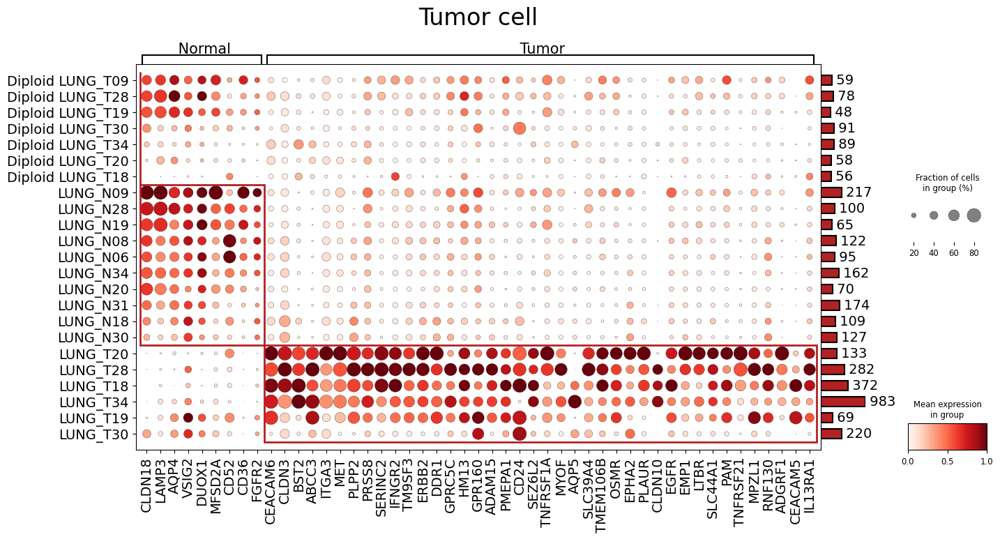

In [ ]:
target_cell = 'Tumor cell'
title = target_cell

mkr_dict_updated = plot_marker_exp(adata_t, markers = tumor_cell_mkr_dict, celltype_selection = target_cell,
                N_cells_per_group_min = 40, N_markers_per_group_max = 40, N_markers_total = 140,
                title = title, title_y_pos = 2, title_fs = 24, text_fs = 14,
                var_group_height = 1.2, var_group_rotation = 0,
                standard_scale = 'var', nz_frac_max = 0.8, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = None, swap_ax = False, add_rect = True,
                cmap = 'Reds', linewidth = 2, linecolor = 'firebrick' )

Num markers selected: 225 -> 120


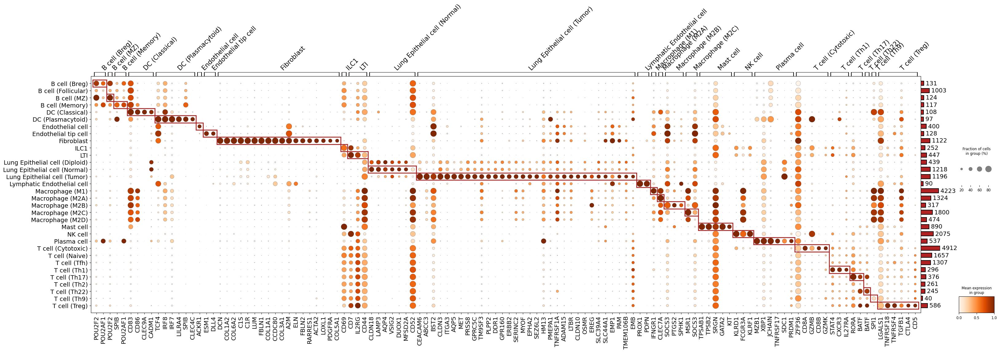

In [ ]:
## Works Only when Tumor cell identification was done.
subset_markers_dict = add_to_subset_markers(
                            adata_t,
                            tumor_cell_mkr_dict,
                            obs_col_to_add = 'celltype_subset_rev')

subset_markers_dict_updated = plot_marker_exp(
                adata_t, markers = subset_markers_dict, celltype_selection = None,
                var_group_col = 'celltype_subset_rev', cell_group_col = 'celltype_subset_rev',
                N_cells_per_group_min = 40, N_markers_per_group_max = 50, N_markers_total = 120,
                title = None, title_y_pos = 2, title_fs = 24, text_fs = 14,
                var_group_height = 1.2, var_group_rotation = 45,
                standard_scale = 'var', nz_frac_max = 0.8, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = None, swap_ax = False, add_rect = True,
                cmap = 'Oranges', linewidth = 2, linecolor = 'firebrick' )

#### __D.4 Examining expression patterns of selected markers using violin plots__

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

celltype_minor
Macrophage          8138
T cell CD8+         4912
T cell CD4+         4768
Alveolar type 2     2463
NK cell             2075
B cell              1375
Fibroblast          1122
unassigned           997
Mast cell            890
ILC                  742
Endothelial cell     618
Plasma cell          537
Cilliated cell       248
Dendritic cell       230
Alveolar type 1      209
Secretory club        74
Name: count, dtype: int64

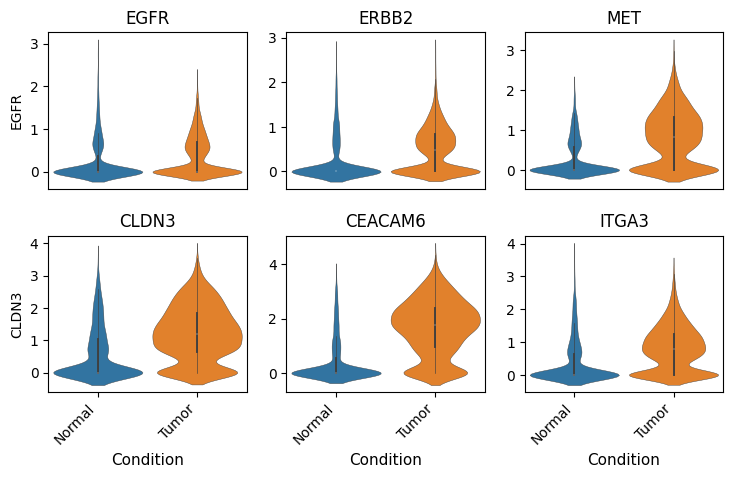

In [ ]:
items_to_plot = ['EGFR', 'ERBB2', 'MET', 'CLDN3', 'CEACAM6', 'ITGA3']

# b = adata_t.obs['celltype_major'] == 'Lung Epithelial cell'
b1 = (adata_t.obs['celltype_for_cci'] == 'Aneuploid Lung Epithelial cell')
b2 = (adata_t.obs['celltype_for_cci'] == 'Diploid Lung Epithelial cell') & (adata_t.obs['condition'] == 'Normal')
b = b1 | b2

adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width',
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott',
             figsize = (2.5,2), dpi = 100,
             text_fs = 10, title = None, title_fs = 14, title_y_pos = 1,
             label_fs = 11, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
             ncols = 3, wspace = 0.2, hspace = 0.3, cmap = 'tab10' )

#### __D.5 Statistical test for mean-expression of condition-specific markers__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [ ]:
target_genes = []

df_all = get_gene_expression_mean( adata_s, genes = target_genes, group_col = 'sample', nz_pct = True )
df_res = test_group_diff( df_all, ref_group = None, pval_cutoff = 0.001 )

with pd.option_context('display.max_rows', 20, 'display.min_rows', 20):
    display(df_res)

,Tumor_vs_Normal
LY6E,3.681127e-11
KRT7,6.595579e-10
S100A13,1.121369e-09
OCIAD2,1.649726e-09
MDK,6.540481e-09
NENF,7.018698e-09
TIMP1,7.987103e-09
TXN,1.023232e-08
S100A16,1.468768e-08
SOX4,1.071419e-07


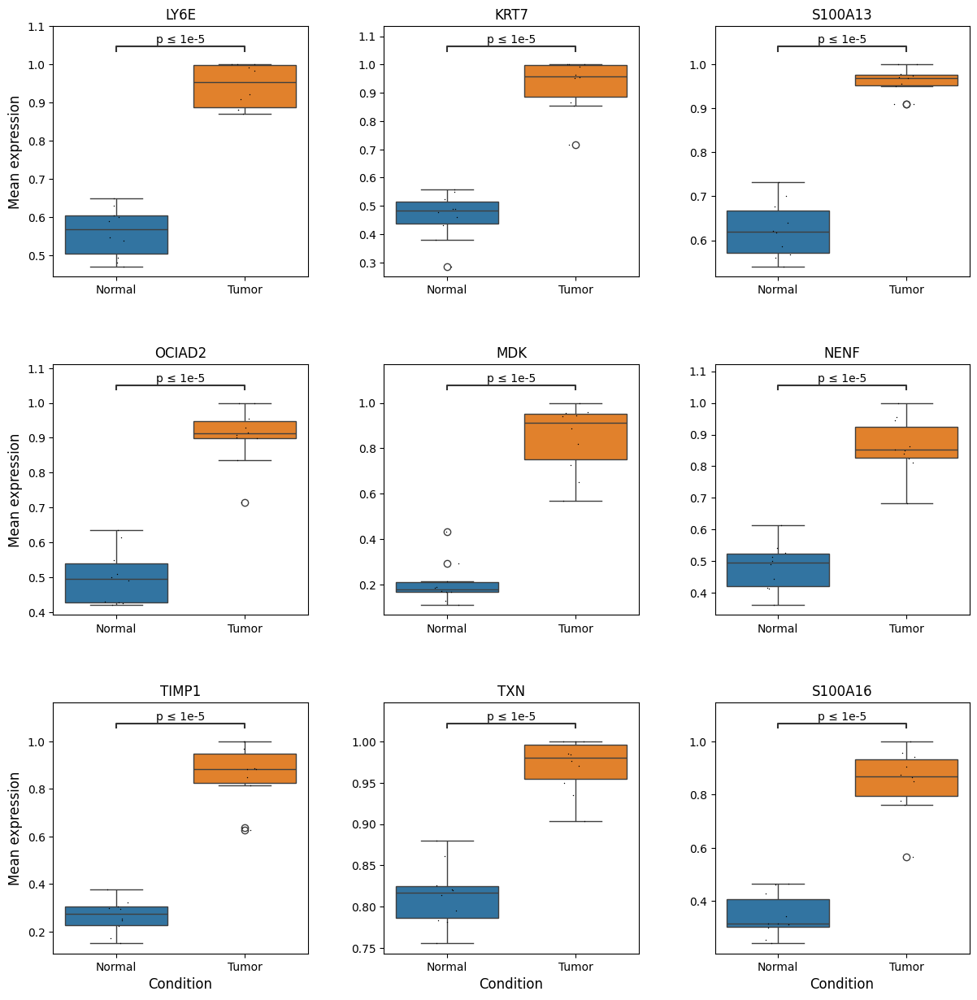

In [ ]:
## Show the first 9 genes
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

plot_pct_box( df_all[items_to_plot], df_all['Group'],
              ylabel = 'Mean expression', ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True, stripplot_ms = 5)

#### __D.6 Statistical test for mean-expression of some selected genes__


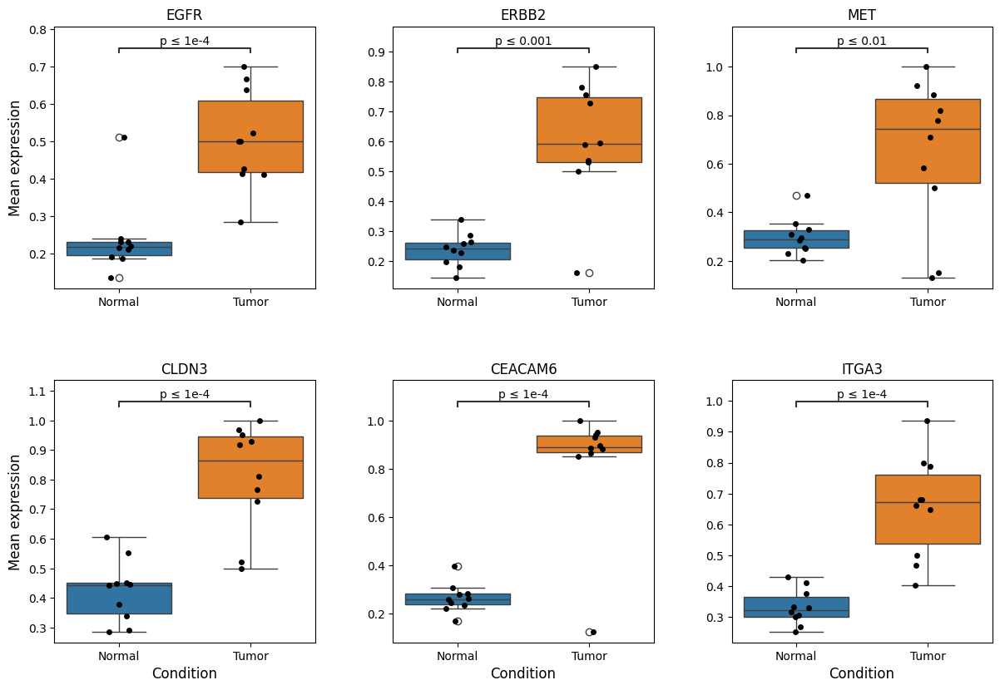

In [ ]:
items_to_plot = ['EGFR', 'ERBB2', 'MET', 'CLDN3', 'CEACAM6', 'ITGA3']

plot_pct_box( df_all[items_to_plot], df_all['Group'],
              ylabel = 'Mean expression', ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True, stripplot_ms=5)

### __E. Gene Set Aanalysis results__
- __GSEApy:__ https://github.com/zqfang/GSEApy

#### __E.1 Structure and format of the GSA/GSEA results__

In [ ]:
gsa_res_up = adata_t.uns['GSA_up']
gsa_res_dn = adata_t.uns['GSA_down']

list(gsa_res_up.keys())

['Diploid Lung Epithelial cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Lung Epithelial cell',
 'Macrophage',
 'Mast cell',
 'NK cell',
 'T cell CD4+',
 'T cell CD8+']

##### __Structure of the GSA/GSEA results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

- The GSA/GSEA results are processed and stored separately for each cell type.
- The results were based on the corresponding DEG results.

In [ ]:
gsa_res = gsa_res_up
target_cell = 'Lung Epithelial cell'

gsa_keys = list(gsa_res[target_cell].keys())
list(gsa_keys)

['Diploid_vs_others', 'Normal_vs_others', 'Tumor_vs_others']

##### __Format of a GSA result__

In [ ]:
gsa_res[target_cell][gsa_keys[2]].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
AGE-RAGE signaling pathway in diabetic complications,5.700060e-04,1.000000e+00,MAPK12;PLCB1;COL1A1;CXCL8;CASP3;NFKB1;PLCB3;AG...,46,100,3.244121,0.000000,AGE-RAGE signaling pathway in diabetic complic...,1
AMPK signaling pathway,2.612031e-03,1.000000e+00,RPS6KB2;CREB1;CRTC2;MTOR;MAP3K7;RAB10;RHEB;PPP...,51,120,2.583022,0.000000,AMPK signaling pathway,1
Acute myeloid leukemia,7.988563e-02,1.000000e+00,RPS6KB2;MTOR;MYC;TCF7L2;NFKB1;RARA;MAP2K2;BRAF...,26,67,1.097531,0.000000,Acute myeloid leukemia,1
Adherens junction,2.190264e-04,1.000000e+00,WASL;CDH1;VCL;FARP2;TCF7L2;EP300;MAP3K7;YES1;T...,36,71,3.659504,0.000000,Adherens junction,1
Alzheimer disease,1.321342e-11,2.746145e-07,SDHA;HSD17B10;PSEN1;WNT3;TUBA4A;BRAF;CAPN2;PSM...,172,369,10.878985,6.561277,Alzheimer disease,1


#### __E.2 Barplot visualization of condition-specific pathways activity__

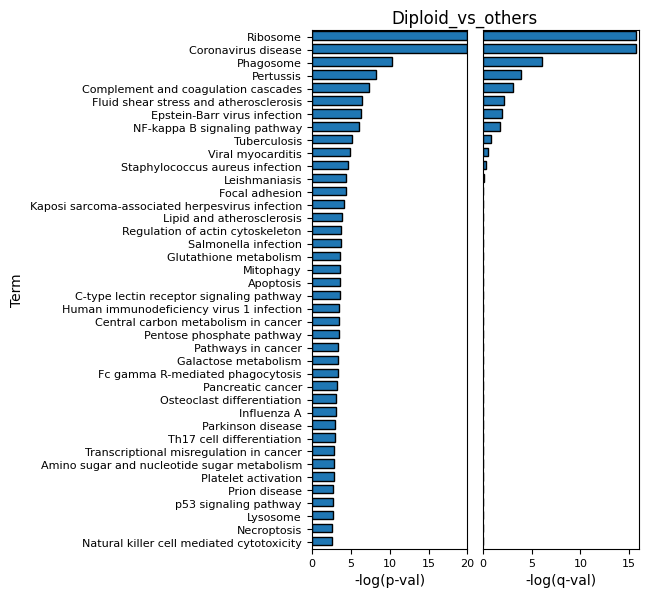

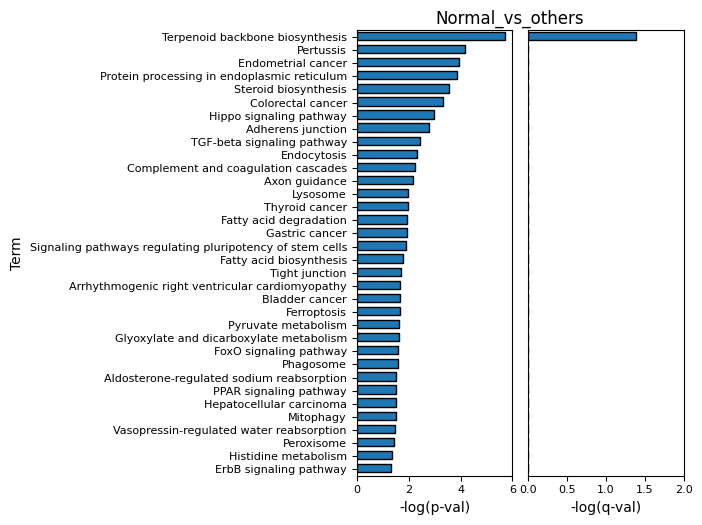

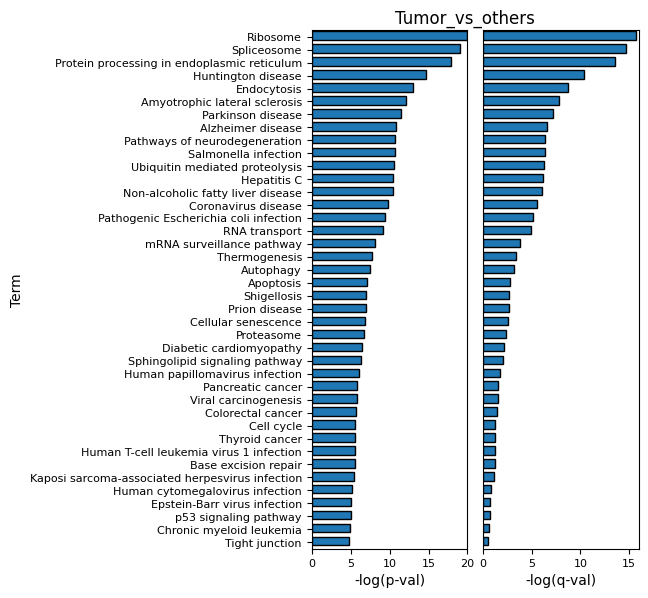

In [ ]:
target_cell = 'Lung Epithelial cell'

df_gsa_dct = gsa_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsa_dct, pval_cutoff = 0.05, N_max_to_show = 40,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'tab:blue', edgecolor = 'black' )

#### __E.3 Dotplot visualization for an overview of condition-specific pathways activity__

In [ ]:
gsa_res = adata_t.uns['GSA_up']
gsa_res.keys()

dict_keys(['Diploid Lung Epithelial cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Lung Epithelial cell', 'Macrophage', 'Mast cell', 'NK cell', 'T cell CD4+', 'T cell CD8+'])

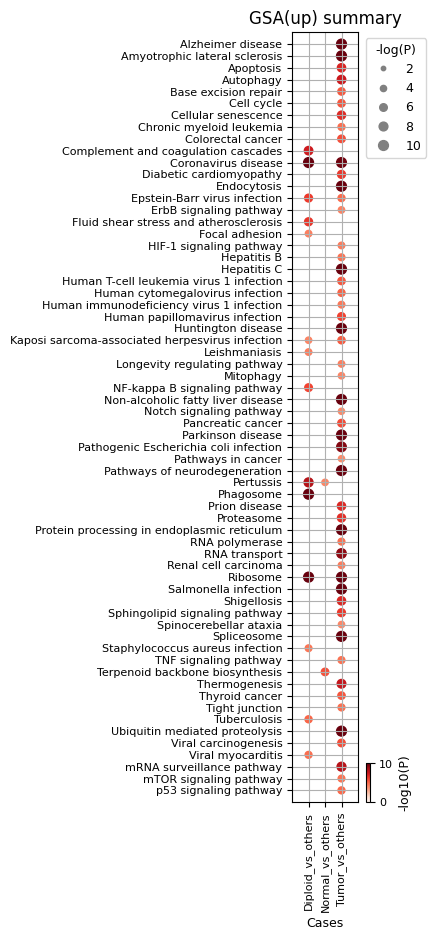

In [ ]:
key = 'Lung Epithelial cell'
gsa_res_t = gsa_res[key]

plot_gsa_dot( gsa_res_t, pval_cutoff = 1e-4, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10, cmap = 'Reds' )

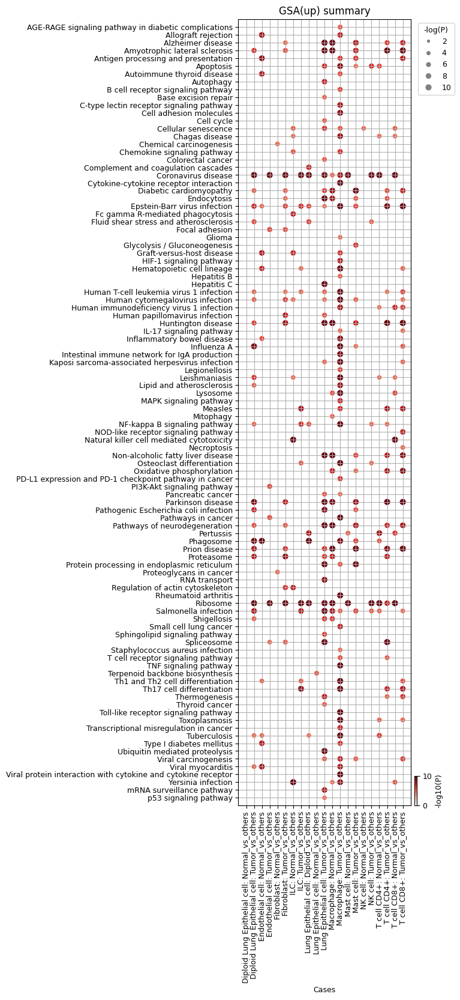

In [ ]:
plot_gsa_dot( gsa_res, pval_cutoff = 1e-5, title = 'GSA(up) summary',
              title_fs = 12, tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 40, cbar_frac = 0.05, cbar_aspect = 15,
              cmap = 'Reds' )

### __F. GSEA results__
#### Data structure and format are the same as those for GSA results

In [ ]:
gsea_res = adata_t.uns['GSEA']
list(gsea_res.keys())

['Diploid Lung Epithelial cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Lung Epithelial cell',
 'Macrophage',
 'Mast cell',
 'NK cell',
 'T cell CD4+',
 'T cell CD8+']

In [ ]:
target_cell = 'Lung Epithelial cell'

gsea_keys = list(gsea_res[target_cell].keys())
list(gsea_keys)

['Diploid_vs_others', 'Normal_vs_others', 'Tumor_vs_others']

#### __F.1 Barplot visualization of condition-specific pathways activity__

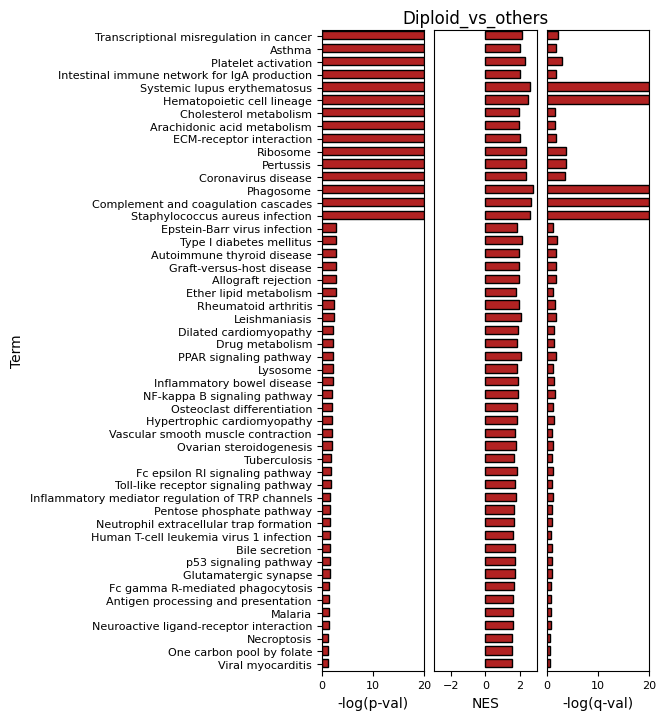

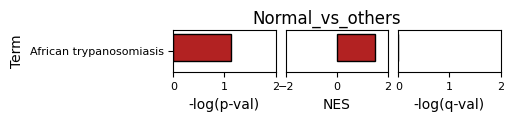

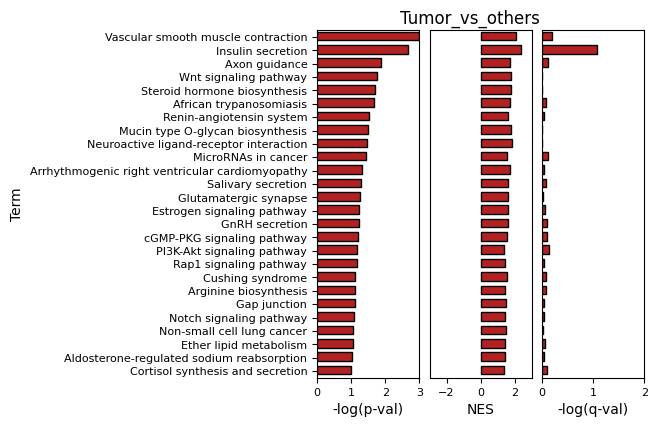

In [ ]:
target_cell = 'Lung Epithelial cell'
# target_cell = 'Aneuploid Epithelial cell'
df_gsea_dct = gsea_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsea_dct, pval_cutoff = 1e-1,
                           nes_cutoff = 0, N_max_to_show = 50,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'firebrick', edgecolor = 'black' )

#### __F.2 Dotplot visualization for an overview of condition-specific pathways activity__

In [ ]:
gsea_res.keys()

dict_keys(['Diploid Lung Epithelial cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Lung Epithelial cell', 'Macrophage', 'Mast cell', 'NK cell', 'T cell CD4+', 'T cell CD8+'])

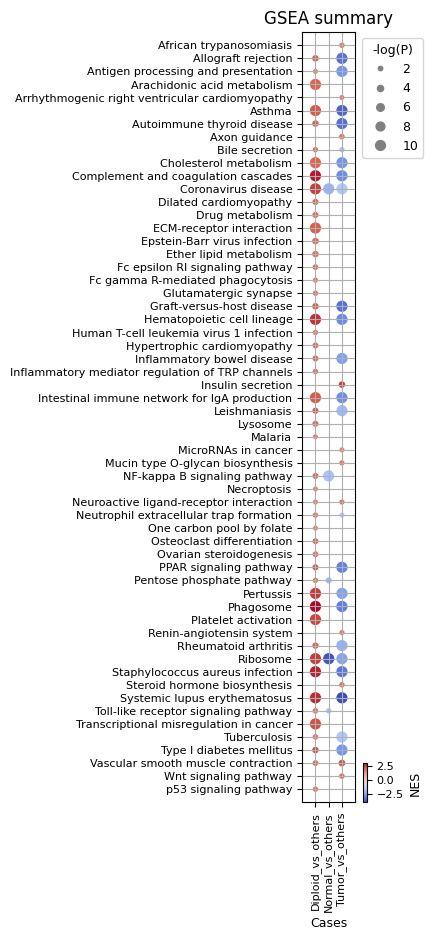

In [ ]:
# target_cell = 'Aneuploid Epithelial cell'
target_cell = 'Lung Epithelial cell'

gsea_res_t = gsea_res[target_cell]
pval_cutoff = 0.05

plot_gsa_dot( gsea_res_t, pval_cutoff = pval_cutoff,
              title = 'GSEA summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10,
              cmap = 'coolwarm' )

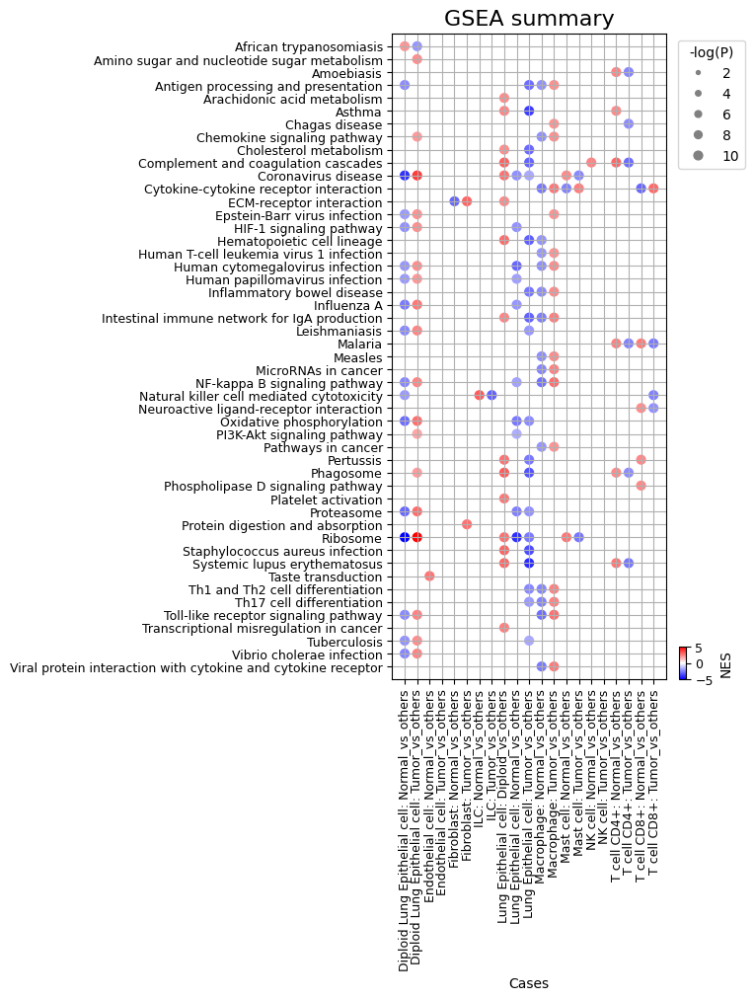

In [ ]:
plot_gsa_dot( gsea_res, pval_cutoff = 1e-4,
              title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False,
              figsize = None, dpi = 100, dot_size = 40,
              cbar_frac = 0.2, cbar_aspect = 5, cmap = 'bwr' )